## In this notebook:
* Analysis of TCGA dataset containing gene expression values for both normal and cancer cells.
* Cancer type is clear cell renal carcinoma (kidney cancer)
* The dataset can be found at: https://tcga.xenahubs.net/download/TCGA.KIRC.sampleMap/HiSeqV2.gz
* Brief discussion of the goal of this project and the workflow
* Data wrangling
* Data filtering
* Exploratory data analysis
* Differential expression analysis
* Correlation analysis
* Unsupervised learning
* Interpretation of results

### Analysis of TCGA gene expression dataset for clear cell renal carcinoma.

The goal of this analysis is to find differences in gene expression profiles between the two sample populations: normal cells vs cancer cells. The two groups will be compared through an analysis of a gene expression dataset downloaded from The Cancer Genome Atlas (TCGA). The dataset contains expression values (sequence counts) generated via the Illumina HiSeq platform. 


### Summary of the Differential Expression Analysis Workflow:

1) Involves identifying genes whose expression levels change between two sample groups.

2) We begin by importing our dataset and necessary packages.

3) Then, we can reduce our dataset by filtering out all genes with zero values.

4) Next, we can split our dataset using regular expressions:

    a) Expression values for cancer cells in one dataframe
    
    b) Expression values for normal cells in another dataframe

5) Because the dataset has already been normalized and log(2) transformed, no additional preprocessing is required

6) We can further truncate our dataset using the IQR method. However, for this demonstration, we only reduce the dataset through filtering out all genes with zero values. 

7) The differential expression (DE) workflow:

    a) Calculate the mean for each row (or each gene) in both dataframes
    
    b) calculate the variance for each row in both dataframes
    
    c) Calculate the t-statistic for each gene across both dataframes
    
    d) Because we have a large number of replicates for each group and only two groups, the t-statistic can be used

8) Show the top 25 differentially expressed genes.

### Purpose and intended audience
* The purpose of this project is to demonstrate pythonic techniques for performing basic gene expression analysis.
* This can be useful to novice bioinformaticians and enthusiasts interested in gene expression analysis. The analysis may also be of use to a general audience interested in learning about risk factors associated with cancer
* Some caveats:
    * Differential expression analysis was performed using the t-statistic method. While the t-test method is suitable in this case because of the size of the dataset, a more generalized technique would utilize Bayesian based methods
    * While hierarchical clustering is one way to find coexpression networks, there are packages specifically designed to perform this function. Many Bioconductor packages (designed for the R programming language) can be called from python using the rpy2 module. Good packages for differential expression and coexpression analysis include edgeR and WGCNA
* The project will conclude with a brief analysis of one coexpression cluster
* We will take a novel approach to gene expression analysis and seek to identify one gene expressed in cancer cells that can be associated with lifestyle factors which may increase the risk of cancer

## Data wrangling

In [1]:
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
 
%matplotlib inline
 
print("Current working directory" , os.getcwd()) # print out current working directory

Current working directory C:\Users\Frank


### Read in data and print header

In [3]:
os.chdir('c:/users/frank/desktop/python_springboard/datasets')

In [4]:
filename = 'HiSeqV2.csv' # assign dataset to filename object
data = pd.read_csv(filename, sep = ',') # read in csv file as pandas dataframe

In [5]:
data = data.set_index('sample')

In [6]:
data.head() # print head to verify proper formatting 

,TCGA-BP-4162-01,TCGA-CJ-5677-11,TCGA-DV-5566-01,TCGA-BP-5191-01,TCGA-BP-5200-01,TCGA-BP-4347-01,TCGA-BP-4770-01,TCGA-B0-5696-11,TCGA-BP-4762-01,TCGA-BP-4158-01,...,TCGA-B0-5104-01,TCGA-A3-3313-01,TCGA-B2-5633-01,TCGA-CJ-4872-01,TCGA-CJ-5684-01,TCGA-CJ-4886-01,TCGA-BP-5009-01,TCGA-BP-4969-01,TCGA-CZ-5461-01,TCGA-CW-5587-01
sample,,,,,,,,,,,,,,,,,,,,,
ARHGEF10L,10.5030,10.8969,10.7612,10.2063,10.0616,10.0193,8.4364,11.1427,9.9150,10.7621,...,10.5586,9.5556,10.2652,9.4981,10.2751,9.9525,10.1273,10.8817,10.1949,10.3294
HIF3A,5.5283,6.4943,5.7842,5.0063,5.3326,7.6102,6.0422,5.9789,3.7802,7.2039,...,6.2061,4.8253,5.1680,8.6195,6.2080,6.3116,6.7446,7.8293,6.1788,6.2293
RNF17,3.8036,0.0000,0.0000,0.0000,0.0000,0.3386,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.6128,0.0000
RNF10,11.4379,12.2130,11.5478,12.3439,11.5149,11.4065,12.1963,12.3946,11.3734,11.3251,...,11.7338,11.7709,11.4968,11.9561,11.7518,11.5698,12.1565,11.3048,11.5168,11.3489
RNF11,11.4180,11.8248,11.3190,10.3413,11.2923,10.9971,11.8936,11.7217,12.2329,11.2993,...,11.7629,10.2373,11.4637,11.4391,11.3992,11.4937,11.4015,10.8842,11.6230,11.5469


### Drop rows with zero values

In [7]:
df_replace = data.replace(0.0000, np.nan)
df_dropped = df_replace.dropna(axis=0, how='any')
df_dropped.shape

(12580, 606)

### Confirm that dropping rows with zero values filtered all outliers

In [12]:
from scipy import stats
df_dropped = df_dropped[(np.abs(stats.zscore(df_dropped)) < 3).all(axis=1)]
df_dropped.shape

(9510, 606)

In [14]:
Q1 = df_dropped.quantile(0.25)
Q3 = df_dropped.quantile(0.75)
IQR = Q3 - Q1
df = df_dropped[~((df_dropped < (Q1 - 1.5 * IQR)) |(df_dropped > (Q3 + 1.5 * IQR))).any(axis=1)]
df_dropped.shape

(9510, 606)

As shown, filtering all values with a z-score less than 3 reduced the dataset by over 1,500 rows

### Let's look at the shape of the distribution for the entire dataset

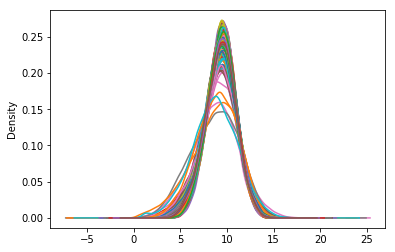

In [49]:
df_dropped.plot(kind='kde', legend=False) 

### Split data into two dataframes:
* The first dataframe (df1) contains expression values for normal cells
* The second dataframe (df2) contains expression values for cancer cells

In [16]:
df1 = df_dropped.filter(regex = 'sample|11$', axis =1)
# Creating new dataframe with only columns containing expression values for normal cells

In [17]:
df1.shape

(9510, 72)

In [18]:
df1.head()

,TCGA-CJ-5677-11,TCGA-B0-5696-11,TCGA-CJ-5679-11,TCGA-CZ-5452-11,TCGA-B0-5712-11,TCGA-CW-5584-11,TCGA-B0-5701-11,TCGA-CZ-5461-11,TCGA-B0-5690-11,TCGA-CZ-5468-11,...,TCGA-CW-5580-11,TCGA-B8-5552-11,TCGA-CZ-4865-11,TCGA-CZ-4863-11,TCGA-B2-5636-11,TCGA-CW-6088-11,TCGA-CZ-5982-11,TCGA-CZ-5469-11,TCGA-CJ-5678-11,TCGA-CZ-5451-11
sample,,,,,,,,,,,,,,,,,,,,,
ARHGEF10L,10.8969,11.1427,10.3362,10.9979,10.6467,10.6163,10.6772,10.5352,10.9610,10.8893,...,10.8603,9.4288,10.3868,10.2874,10.9476,10.8848,10.7783,10.3262,10.4025,10.9598
RNF10,12.2130,12.3946,12.3002,12.4976,12.1206,12.1293,12.1640,12.2868,12.2738,12.2829,...,12.4214,11.3729,11.9933,11.9568,12.1550,12.4600,12.0911,12.3941,12.0396,12.2514
RNF11,11.8248,11.7217,12.0602,11.6335,11.8102,11.6994,11.5128,11.9681,11.5019,11.7200,...,11.6284,12.6320,11.9769,11.9774,11.6255,11.4753,11.9079,11.7476,11.9066,11.7847
RNF13,10.7779,10.8412,10.8172,10.9679,10.7033,10.6184,10.7271,11.0801,10.9754,10.7149,...,11.0227,11.2715,11.0244,10.7831,10.8893,10.9174,10.8537,10.6932,11.0341,10.9808
GTF2IP1,12.5998,12.4681,12.6775,12.6877,12.4485,12.4697,12.6039,12.5141,12.6449,12.5210,...,12.7747,12.7713,12.5653,12.6067,12.4296,13.0627,12.7845,13.2109,12.8098,12.2869


In [19]:
df2 = df_dropped.filter(regex = 'sample|01|05$', axis = 1)
# Creating new dataframe with only columns containing expression values for cancer cells

In [20]:
df2.shape

(9510, 535)

# Exploratory data analysis


## Generate density plots to confirm the shape of the distribution

#### KDE plots of processed data separated by sample type (cancer/normal)

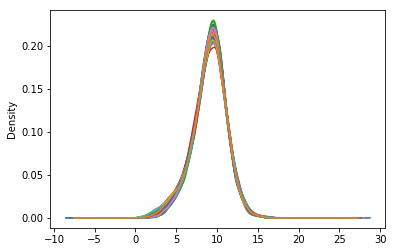

In [19]:
df1.plot(kind='kde', legend=False) # normal cells

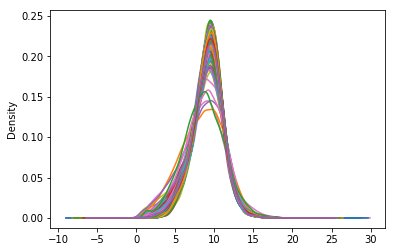

In [20]:
df2.plot(kind='kde', legend=False) # cancer cells

* Both gene exp dataframes appear normally distributed
* This confirms that the original dataset has been normalized

### Add columns with row-wise mean & variance to gene exp dataframes

In [21]:
import warnings
warnings.simplefilter("ignore")
from scipy.stats import ttest_ind, ttest_ind_from_stats


df1['mean1'] = df1[df1.columns].mean(axis=1)
df1['variance1'] = df1[df1.columns].var(axis=1)
df2['mean2'] = df2[df2.columns].mean(axis=1)
df2['variance2'] = df2[df2.columns].var(axis=1)



In [22]:
df1_stats = df1[['mean1', 'variance1']]
df1_stats.head()

,mean1,variance1
sample,,
ARHGEF10L,10.587401,0.124498
RNF10,12.214072,0.057677
RNF11,11.827933,0.047012
RNF13,10.933962,0.038483
GTF2IP1,12.697869,0.083764


In [23]:
df2_stats = df2[['mean2', 'variance2']]
df2_stats.head()

,mean2,variance2
sample,,
ARHGEF10L,10.132370,0.506471
RNF10,11.675401,0.102617
RNF11,11.322741,0.198024
RNF13,10.980765,0.231565
GTF2IP1,12.394156,0.192427


### Concatenate mean/variance columns of gene exp dataframes

In [24]:
df = pd.concat([df1_stats, df2_stats], axis=1)

In [25]:
df1.shape

(9510, 74)

In [26]:
df2.shape

(9510, 537)

### Visualize the new dataframe to confirm proper formatting

In [61]:
df.head(3)

,mean1,variance1,mean2,variance2
sample,,,,
ARHGEF10L,10.587401,0.124498,10.132370,0.506471
RNF10,12.214072,0.057677,11.675401,0.102617
RNF11,11.827933,0.047012,11.322741,0.198024


### Generate scatter plot (similar to MA-plot) to confirm that biological differences exist between the two gene expression dataframes

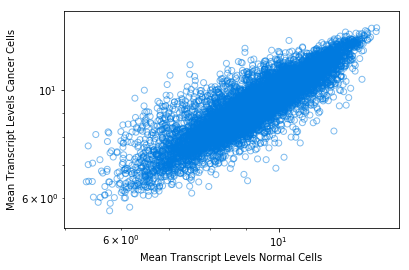

In [27]:
import copy
import matplotlib.pyplot as plt
my_figure = plt.figure()
plt.loglog() # log-scaling makes it easier


plot_df = copy.deepcopy(df)


# now, make a scatter plot
plt.scatter(x=plot_df["mean1"],
            y=plot_df["mean2"],
            marker=None,alpha=0.5,facecolor="none",edgecolor="#007ADF")
plt.xlabel("Mean Transcript Levels Normal Cells")
plt.ylabel("Mean Transcript Levels Cancer Cells")

plt.show()



* We can see genes with significant differences in mean expression levels
* This indicates that true biological differences exist between the cancer and normal gene exp dataframes

In [34]:
# min-max scaling
df_scaled = (df-df.min())/(df.max()-df.min())


In [35]:
# Z-score normalization
df_scaled2 = (df - df.mean())/df.std()


In [36]:
df = np.log2(df)

# Differential expression analysis
* Run t-test and load results in new column
* Sort results in descending order
* Print top 25 differentially expressed genes

In [62]:
df['ttest'] = abs((df['mean1'] - df['mean2'])/(np.sqrt(df['variance1']/74 + df['variance2']/537)))

In [63]:
diffexp_results = df['ttest']
diffexp = diffexp_results.sort_values(ascending=False)
diffexp.shape

(11002,)

## The top 25 differentially expressed genes:

In [64]:
results = diffexp.iloc[1:25]
results

sample
NOL3        41.102853
BRCC3       39.666073
C7orf68     39.328517
SLC15A4     38.738762
DDB2        37.573465
ZNF395      36.747181
SPAG4       36.731714
KRBA1       36.530676
MECOM       35.674698
PIP4K2C     35.659240
SLC2A12     34.815115
ANXA9       34.602081
TMEM91      34.378348
CLEC2D      34.314237
C9orf100    34.303152
MAN1C1      33.959008
KLHL13      33.840880
SAP30       33.778910
EPB41L5     33.239333
LRRC16A     32.981177
ATP6V1H     32.723150
NETO2       32.702144
SEMA5B      32.670660
SNX33       32.656142
Name: ttest, dtype: float64

## Unsupervised learning
* Create correlation matrices from our two dataframes
* Find genes closely correlated with our top 25 differentially expressed genes
* Perform hierarchical clustering with dendrograms

### Correlation analysis
* Transpose dataframes so gene names are column names
* Perform correlation analysis using corr()

In [66]:
df1_t = df1.T
correlations1 = df1_t.corr()
correlations1.head()

sample,ARHGEF10L,RNF10,RNF11,RNF13,GTF2IP1,C16orf13,FGFR1OP2,ATRX,PMM2,NCBP1,...,NFIX,PLEKHG4,PLEKHG5,METTL11A,GNGT2,TULP3,PTRF,BCL6B,GSTK1,SELS
sample,,,,,,,,,,,,,,,,,,,,,
ARHGEF10L,1.000000,0.970761,0.927974,0.936019,0.943749,0.865414,0.914637,0.928521,0.886858,0.923451,...,0.862830,0.659032,0.817536,0.931738,0.597595,0.954517,0.839749,0.782195,0.950700,0.922549
RNF10,0.970761,1.000000,0.957809,0.965588,0.977922,0.888602,0.947767,0.955082,0.888031,0.962061,...,0.859780,0.693690,0.866657,0.960846,0.687354,0.978907,0.901826,0.849210,0.953211,0.964064
RNF11,0.927974,0.957809,1.000000,0.990070,0.963357,0.887420,0.986602,0.953788,0.919796,0.969054,...,0.886462,0.668426,0.828876,0.961524,0.642374,0.971171,0.915200,0.823709,0.958642,0.979892
RNF13,0.936019,0.965588,0.990070,1.000000,0.968751,0.902966,0.982807,0.952748,0.912821,0.961853,...,0.875036,0.682377,0.838143,0.960455,0.691540,0.972933,0.906519,0.826911,0.969741,0.977945
GTF2IP1,0.943749,0.977922,0.963357,0.968751,1.000000,0.862039,0.960981,0.965925,0.859177,0.966290,...,0.845059,0.682013,0.872385,0.942349,0.697118,0.966853,0.904177,0.868625,0.931999,0.959863


In [67]:
# reduce number of replicates to 74 to improve computational efficiency
df2 = df2.iloc[:,0:74]
df2.shape

(11002, 74)

In [68]:
df2_t = df2.T
correlations2 = df2_t.corr()
correlations2.head()

sample,ARHGEF10L,RNF10,RNF11,RNF13,GTF2IP1,C16orf13,FGFR1OP2,ATRX,PMM2,NCBP1,...,NFIX,PLEKHG4,PLEKHG5,METTL11A,GNGT2,TULP3,PTRF,BCL6B,GSTK1,SELS
sample,,,,,,,,,,,,,,,,,,,,,
ARHGEF10L,1.000000,-0.173580,-0.241433,-0.087010,0.129747,0.298257,-0.098879,-0.234766,0.032802,-0.305474,...,-0.017423,0.116879,0.324520,-0.279668,0.091295,0.279363,0.153294,0.041579,0.077323,-0.219571
RNF10,-0.173580,1.000000,0.079668,0.004473,0.245814,0.047225,-0.203526,-0.259482,0.271190,-0.102757,...,-0.261560,-0.186192,-0.262662,0.344579,-0.209520,-0.286742,-0.138825,-0.354226,0.378698,0.214445
RNF11,-0.241433,0.079668,1.000000,0.325274,-0.033927,-0.240425,0.184659,0.226010,-0.364231,0.132752,...,-0.150486,-0.220389,-0.234318,0.335986,-0.265711,-0.347088,-0.025457,0.134547,0.036823,0.142740
RNF13,-0.087010,0.004473,0.325274,1.000000,-0.112549,-0.002180,0.048698,-0.012031,-0.276597,-0.023126,...,-0.495201,-0.508828,-0.622796,0.428826,-0.384353,-0.653723,-0.624539,-0.376590,0.415809,0.377531
GTF2IP1,0.129747,0.245814,-0.033927,-0.112549,1.000000,0.095762,-0.158679,-0.142875,0.142706,-0.273391,...,0.105980,0.139567,0.204966,-0.268114,-0.150198,0.106759,-0.085470,-0.192850,0.355750,-0.262686


### Create dataframes with correlated values for differentially expressed genes

In [69]:
diff_exp1 = correlations1[['NOL3', 'BRCC3', 'C7orf68', 'SLC15A4', 'DDB2', 'ZNF395', 'SPAG4', 'KRBA1', 'MECOM', 'PIP4K2C', 'SLC2A12', 'ANXA9', 'TMEM91', 'CLEC2D', 'C9orf100', 'MAN1C1', 'KLHL13', 'SAP30', 'EPB41L5', 'LRRC16A', 'ATP6V1H', 'NETO2', 'SEMA5B', 'SNX33']]

In [70]:
diff_exp2 = correlations2[['NOL3', 'BRCC3', 'C7orf68', 'SLC15A4', 'DDB2', 'ZNF395', 'SPAG4', 'KRBA1', 'MECOM', 'PIP4K2C', 'SLC2A12', 'ANXA9', 'TMEM91', 'CLEC2D', 'C9orf100', 'MAN1C1', 'KLHL13', 'SAP30', 'EPB41L5', 'LRRC16A', 'ATP6V1H', 'NETO2', 'SEMA5B', 'SNX33']]

### Create object with only highly correlated genes

In [71]:
top_corr1 = diff_exp1[(diff_exp1 >= abs(0.90)).any(1)]
top_corr1 = diff_exp1[(diff_exp1 < abs(1.0)).any(1)]

In [72]:
top_corr1.shape

(11002, 24)

In [73]:
top_corr2 = diff_exp2[(diff_exp2 >= abs(0.90)).any(1)]
top_corr2 = diff_exp2[(diff_exp2 < abs(1.0)).any(1)]

In [74]:
top_corr2.shape

(11002, 24)

### Let's look at heatmaps of the top correlated cancer and normal genes

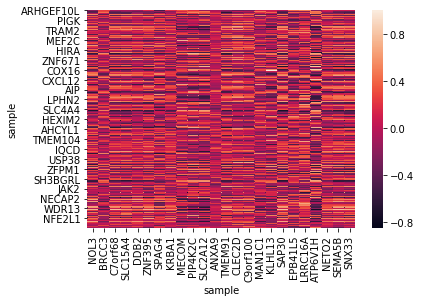

In [75]:
import seaborn as sns
sns.heatmap(top_corr2)

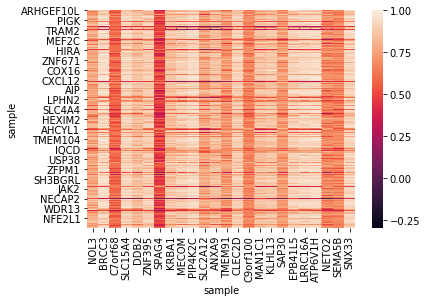

In [76]:
sns.heatmap(top_corr1)

### Let's generate pairs plots for the correlation data to further demonstrate the trends shown by the heatmaps

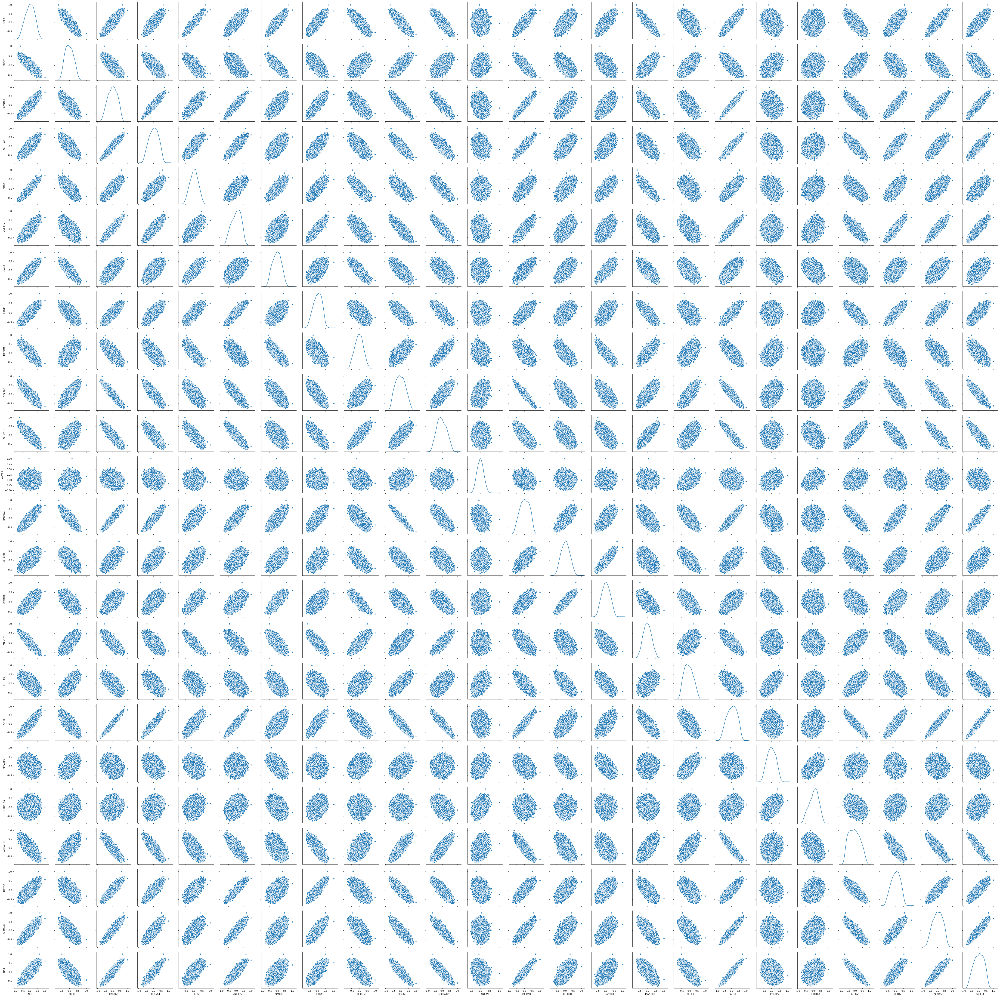

In [77]:
sns.pairplot(top_corr2, diag_kind='kde') 

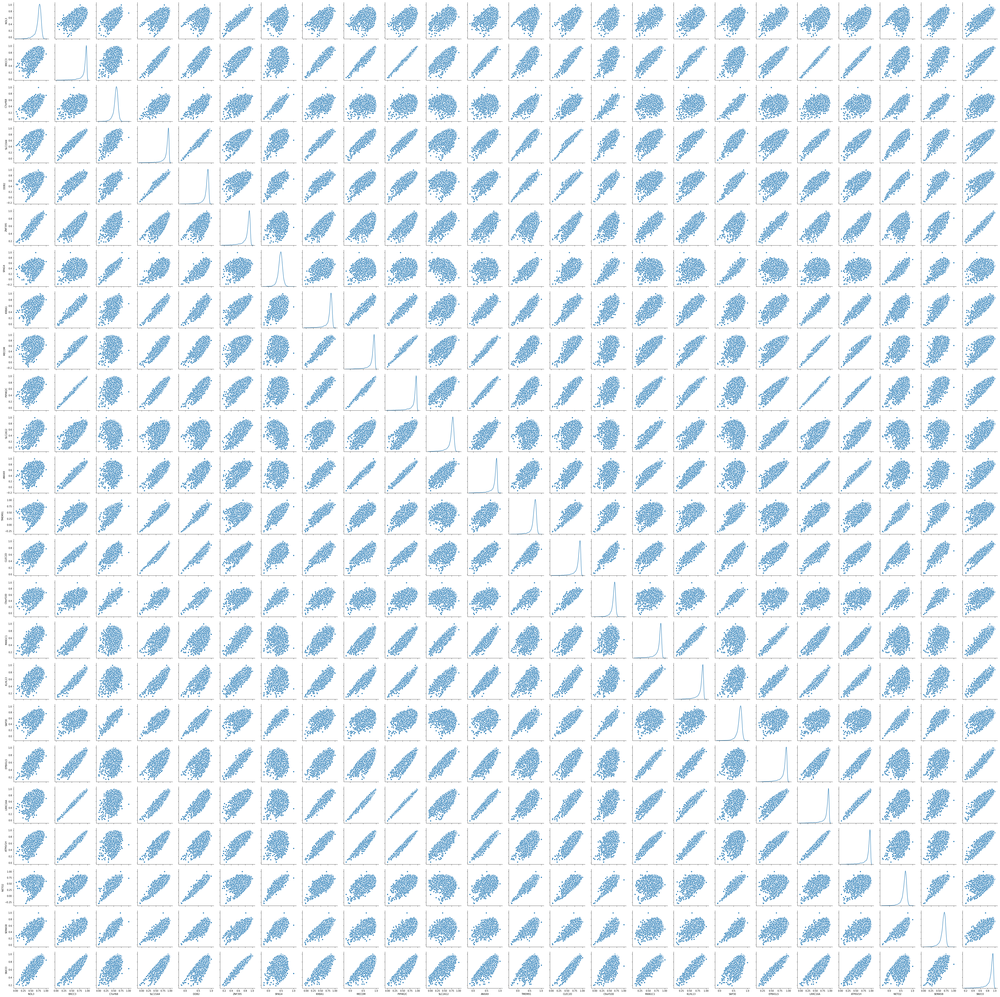

In [79]:
sns.pairplot(top_corr1, diag_kind='kde') 

### Interpretation of the correlation data:
* Most of the correlations in the cancer data are negative
* Conversely, most of the correlations in the normal cell data are positive
* This tells us that there's likely a high number of antagonistic correlations in kidney cancer cell gene expression
* Put another way, we see a high number of genes which are negatively regulating gene expression in kidney cancer cells
* This is not surprising, since oncogenes routinely inhibit important cellular functions such as apoptosis and cell cycle regulation

## Hierarchical clustering
* Import packages
* Create separate objects for values and indexes of correlation data
* Create dendrograms

In [80]:
import scipy
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster.hierarchy import fcluster
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist
from pylab import rcParams
import sklearn

In [81]:
topcorr_values1 = top_corr1.values
topcorr_index1 = top_corr1.index


In [82]:
Z = linkage(topcorr_values1, 'ward')


### Cluster dendrogram of differentially expressed genes correlated with normal cell samples

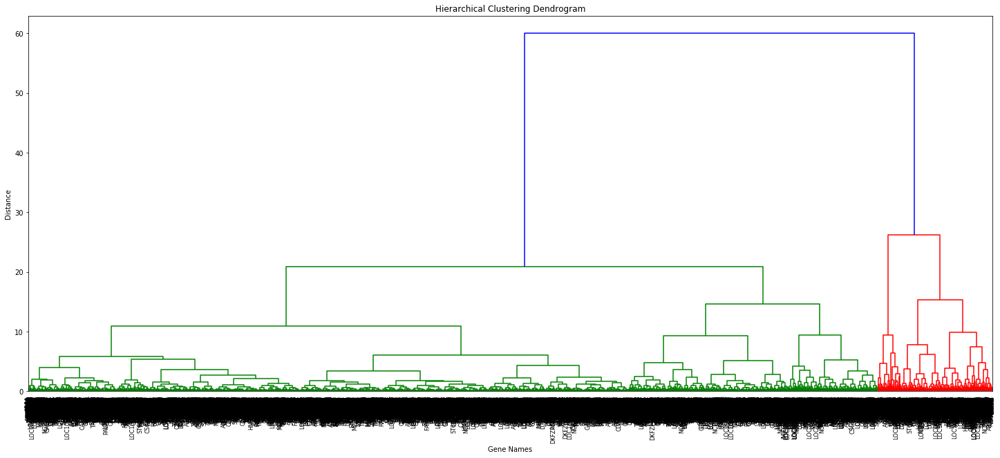

In [83]:
plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Gene Names')
plt.ylabel('Distance')
dendrogram(
    Z,
    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=8.,  # font size for the x axis labels
    labels = topcorr_index1
)
plt.show()

In [41]:
topcorr_values2 = top_corr2.values
topcorr_index2 = top_corr2.index

In [42]:
Z2 = linkage(topcorr_values2, 'ward')


### Dendrogram of hierarchical clustering of differentially expressed genes correlated with cancer cell samples

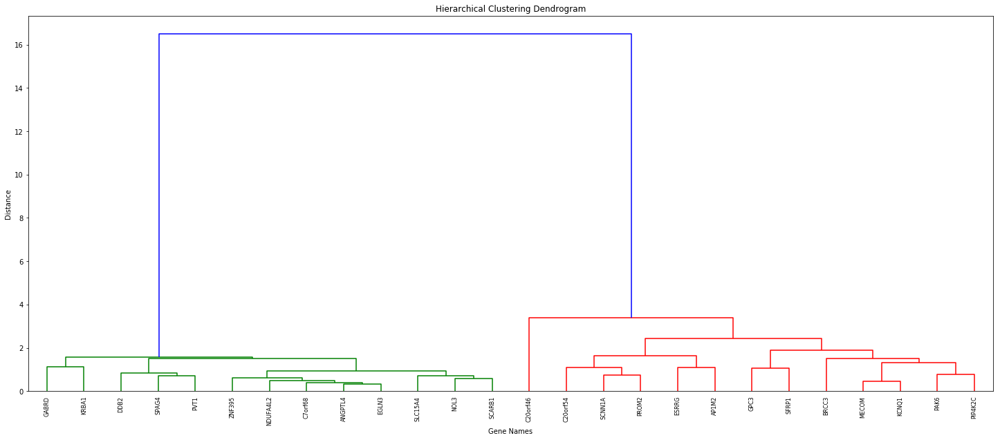

In [43]:
plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Gene Names')
plt.ylabel('Distance')
dendrogram(
    Z2,
    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=8.,  # font size for the x axis labels
    labels = topcorr_index2
)
plt.show()

## Analysis of results

## Let's analyze the green clusters from both dendrograms:
* The only gene that does not appear in our list of top differentially expressed genes is ANGPTL4 (in the cancer set)
* The only gene in the normal cell set that does not appear in the cancer set is C20orf46
* While ANGPTL4 is expressed in kidney tissue, it's more prominently expressed in liver and fat cells
* ANGPTL4 denotes angiopoietin like 4, which codes a protein involved in glucose homeostasis, lipid metabolism, and
insulin sensitivity
* C20orf46 is an alias for the TMEM74B gene, a transmembrane (TM) protein, which is a type of integral membrane protein that 
spans the entire cell membrane 
* TM proteins often acts as gateways (only select molecules into the cell) or regulatory proteins which undergo 
conformational changes when bound by specific molecules that triggers activation or inhibition of cell signal pathways
* Let's focus on ANGPTL4

In [131]:
os.chdir('c:/users/frank/desktop')

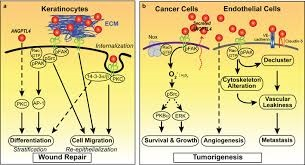

In [142]:
from IPython.core.display import Image, display
Image(filename = "ANGPTL4.jpg", width=500, height=400)
# Pengcheng Zhu, Yan Yih Goh, Hwee Fang Alison Chin, Sander Kersten, Nguan Soon Tan, Angiopoietin-like 4: a decade of research, Bioscience Reports (Dec. 22, 2011)

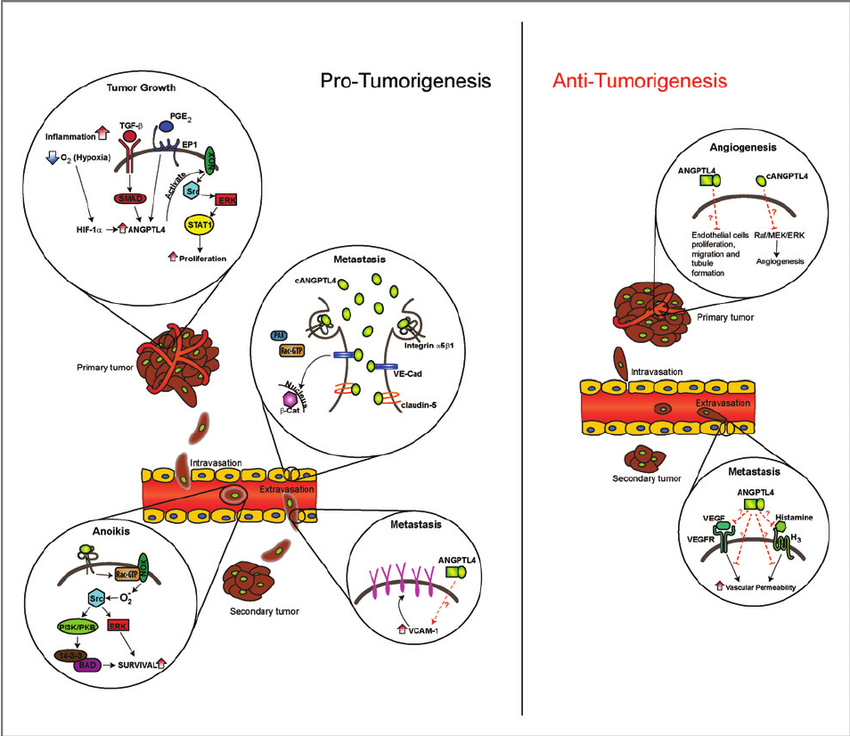

In [140]:
Image(filename = "ANGPTL4_2.PNG", width=500, height=400)
# Jie Tan, Ming & Teo, Ziqiang & Sng, Ming Keat & Zhu, Pengcheng & Tan, Nguan Soon. (2012). Emerging Roles of Angiopoietin-like 4 in Human Cancer. Molecular cancer research : MCR. 10. 677-88. 10.1158/1541-7786.MCR-11-0519. Angiopoietin-like 4 (ANGPTL4) is best known for its role as an adipokine involved in the regulation of lipid and glucose metabolism. The characterization of ANGPTL4 as an adipokine is largely due to our limited understanding of the interaction partners of ANGPTL4 and how ANGPTL4 initiates intracellular signaling. Recent findings have revealed a critical role for ANGPTL4 in cancer growth and progression, anoikis resistance, altered redox regulation, angiogenesis, and metastasis. Emerging evidence suggests that ANGPTL4 function may be drastically altered depending on the proteolytic processing and posttranslational modifications of ANGPTL4, which may clarify several conflicting roles of ANGPTL4 in different cancers. Although the N-terminal coiled-coil region of ANGPTL4 has been largely responsible for the endocrine regulatory role in lipid metabolism, insulin sensitivity, and glucose homeostasis, it has now emerged that the COOH-terminal fibrinogen-like domain of ANGPTL4 may be a key regulator in the multifaceted signaling during cancer development. New insights into the mechanistic action of this functional domain have opened a new chapter into the possible clinical application of ANGPTL4 as a promising candidate for clinical intervention in the fight against cancer. This review summarizes our current understanding of ANGPTL4 in cancer and highlights areas that warrant further investigation. A better understanding of the underlying cellular and molecular mechanisms of ANGPTL4 will reveal novel insights into other aspects of tumorigenesis and the potential therapeutic value of ANGPTL4.

* As displayed in the two images above, ANGPTL4 can both promote and inhibit cancer formation
* Since this gene is expressed in our cancer set, we can infer a pro-tumorigenic role in this case
* Genetic variants in ANGPTL4 are robustly associated with triglyceride and high-density lipoprotein 
cholesterol (HDL-C) levels in humans. 
    * See V. Gusarova et al., Genetic inactivation of ANGPTL4 improves 
      glucose homeostasis and is associated with reduced risk of diabetes, Nature Communications (June 13, 2018)
* Inactivation of ANGPTL4 is associated with reduced risk of diabetes. See Id.
* Obesity is a major risk factor for diabetes and insulin resistance
* Because ANGPTL4 is involved in glucose homeostasis and insulin sensitivity, we might infer that obesity
increases the risk of kidney cancer
* However, cancer cells also exhibit increased levels of glucose uptake
* Nevertheless, numerous studies confirm that obesity increases our risk of cancer
* Therefore, this may add to the mounting evidence which has established a link between obesity and cancer



#### Hypothesis: ANGPTL4 is overexpressed in clear cell renal carcinoma tumor cells relative to expression levels in normal cells

In [20]:
df1.loc['ANGPTL4'].mean(axis=0)

7.822367461578216

In [21]:
df2.loc['ANGPTL4'].mean(axis=0)

13.52237010152571

* As shown, mean expression levels in clear cell renal carcinoma tumor cells is nearly double the levels found in normal cells.
* This provides good evidence supporting the hypothesis.